In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from tensorflow import keras

In [40]:
import os
import random
import warnings
warnings.filterwarnings('ignore')

In [6]:
path = r"/mnt/c/Rig/Pandora's BOX/DL/Datasets/Agricultural-crops"
subfolders = [folder for folder in os.listdir(path) if os.path.isdir(os.path.join(path, folder))]

In [6]:
subfolders

['almond',
 'banana',
 'cardamom',
 'Cherry',
 'chilli',
 'clove',
 'coconut',
 'Coffee-plant',
 'cotton',
 'Cucumber',
 'Fox_nut(Makhana)',
 'gram',
 'jowar',
 'jute',
 'Lemon',
 'maize',
 'mustard-oil',
 'Olive-tree',
 'papaya',
 'Pearl_millet(bajra)',
 'pineapple',
 'rice',
 'soyabean',
 'sugarcane',
 'sunflower',
 'tea',
 'Tobacco-plant',
 'tomato',
 'vigna-radiati(Mung)',
 'wheat']

Crop: almond


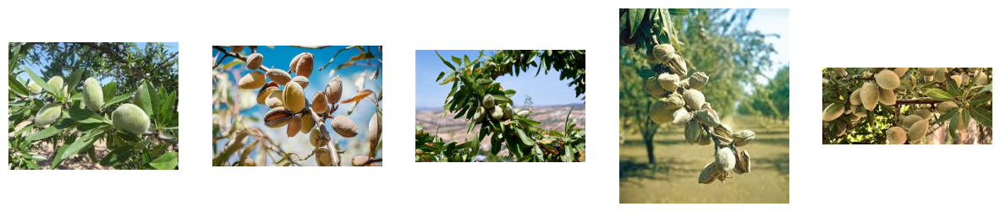

Crop: banana


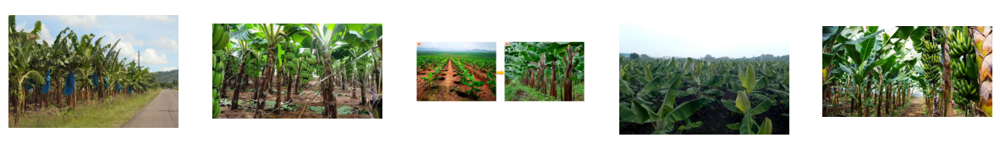

Crop: cardamom


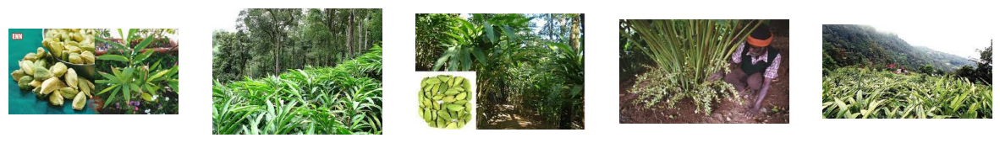

Crop: Cherry


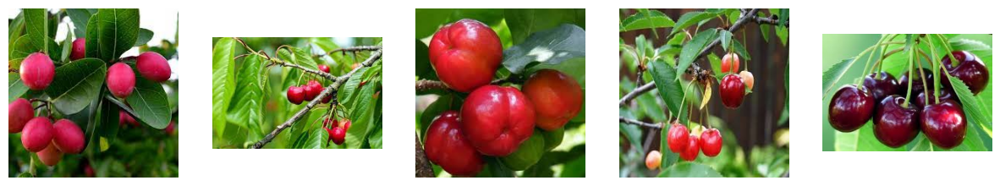

Crop: chilli


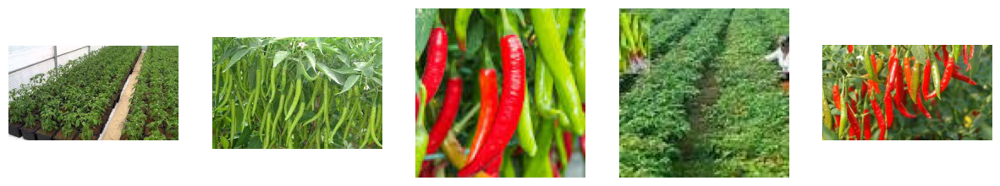

Crop: clove


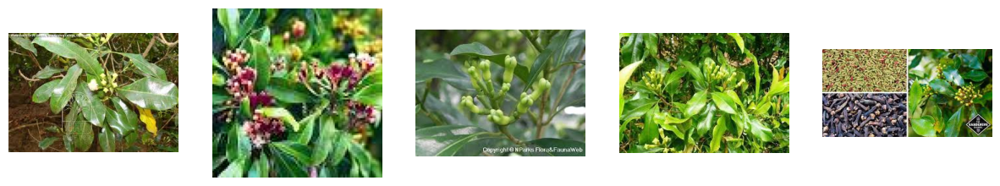

Crop: coconut


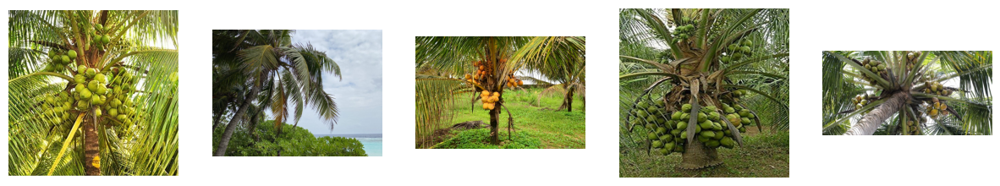

Crop: Coffee-plant


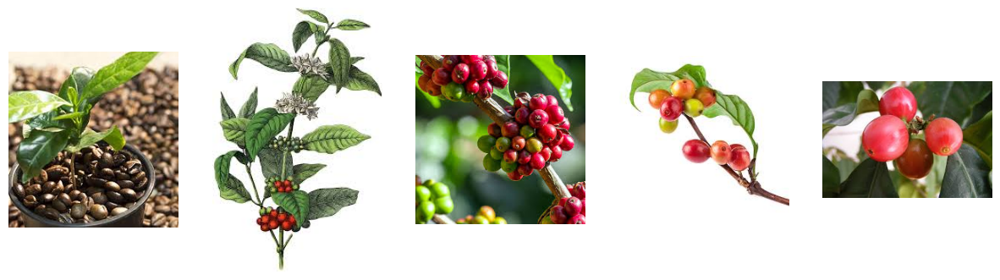

Crop: cotton


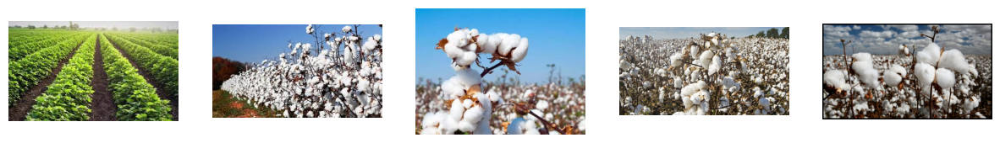

Crop: Cucumber


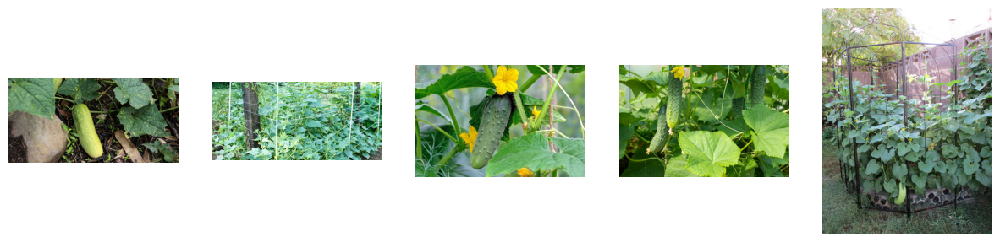

Crop: Fox_nut(Makhana)


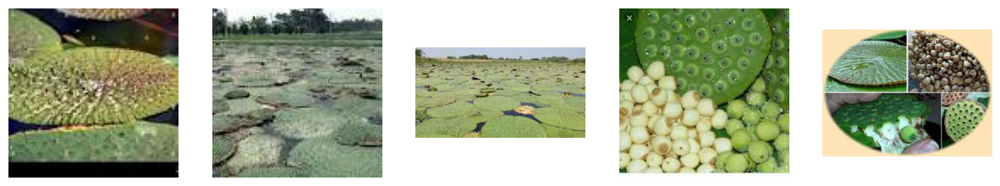

Crop: gram


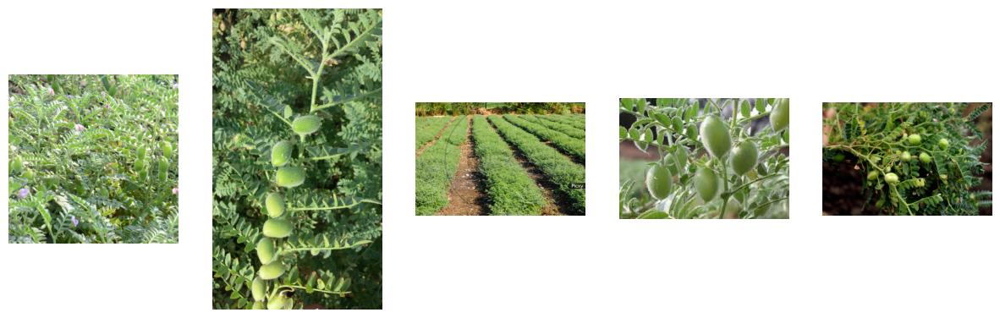

Crop: jowar


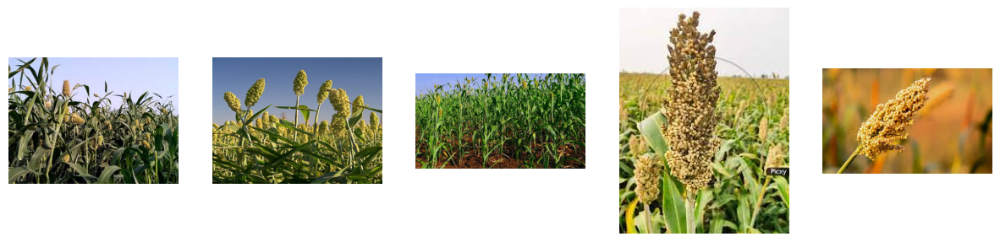

Crop: jute


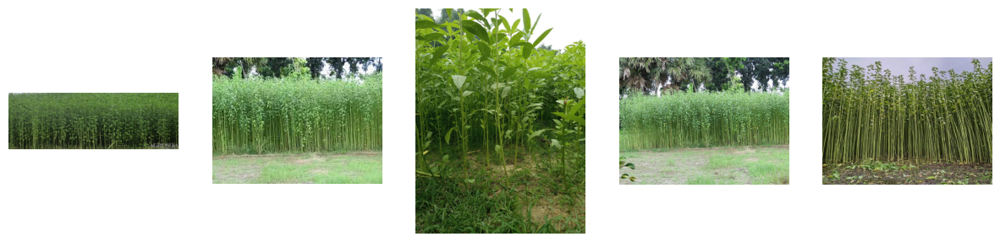

Crop: Lemon


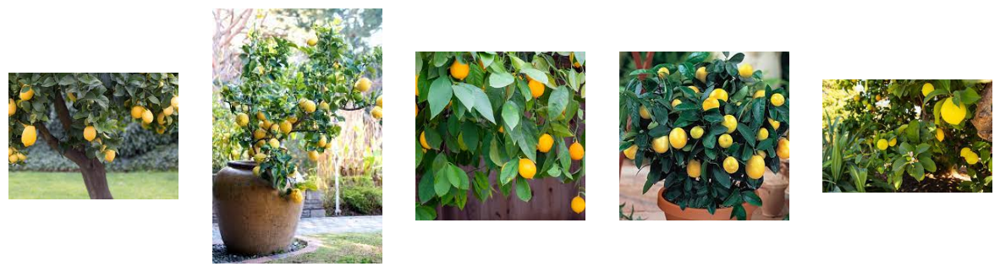

Crop: maize


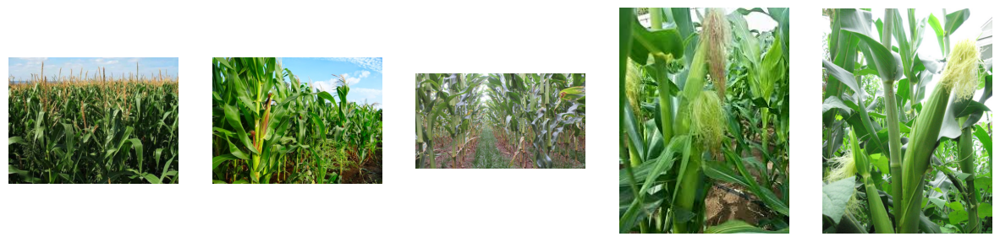

Crop: mustard-oil


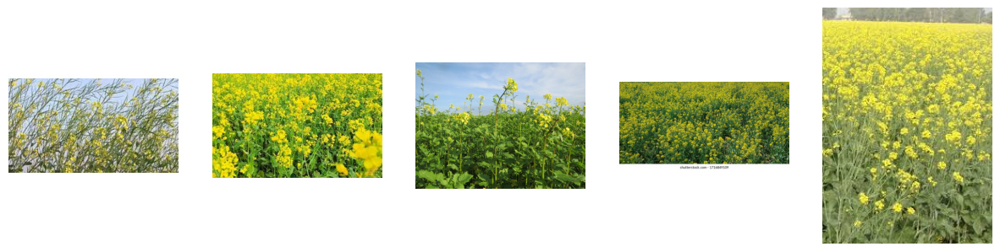

Crop: Olive-tree


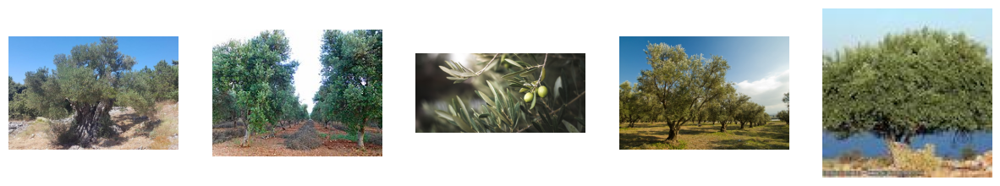

Crop: papaya


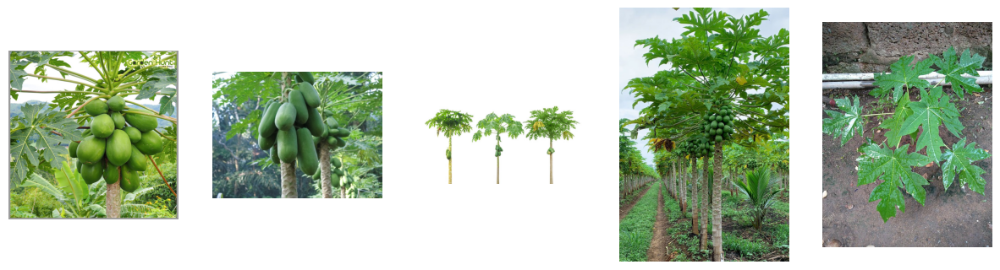

Crop: Pearl_millet(bajra)


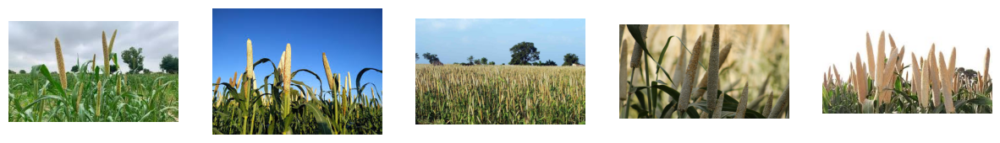

Crop: pineapple


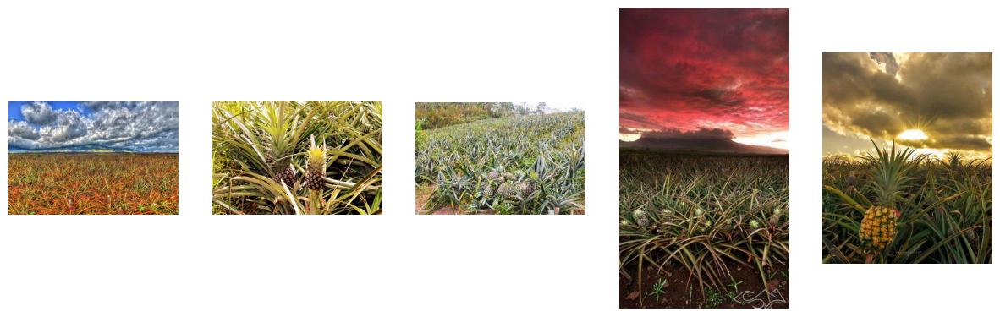

Crop: rice


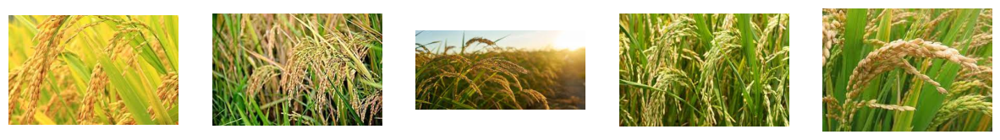

Crop: soyabean


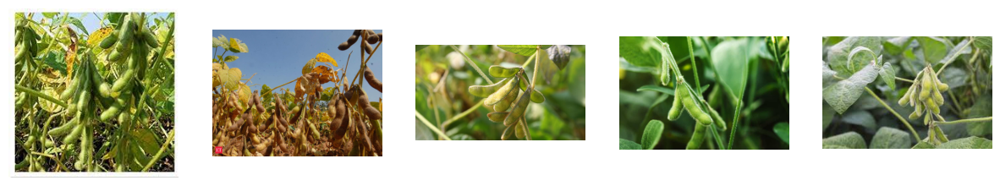

Crop: sugarcane


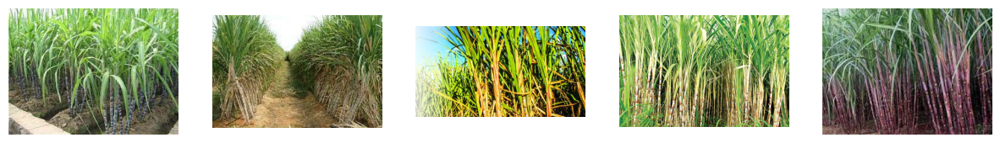

Crop: sunflower


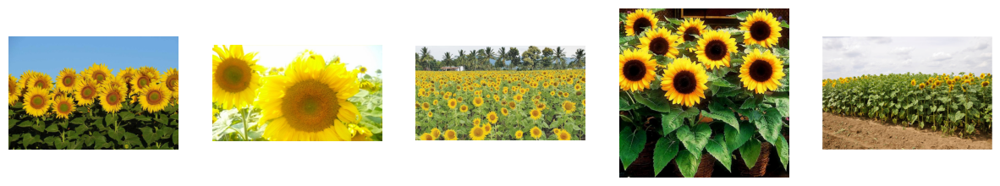

Crop: tea


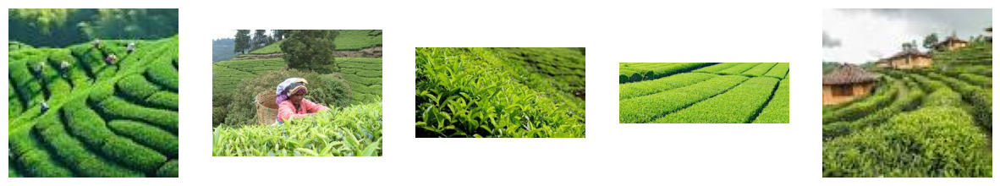

Crop: Tobacco-plant


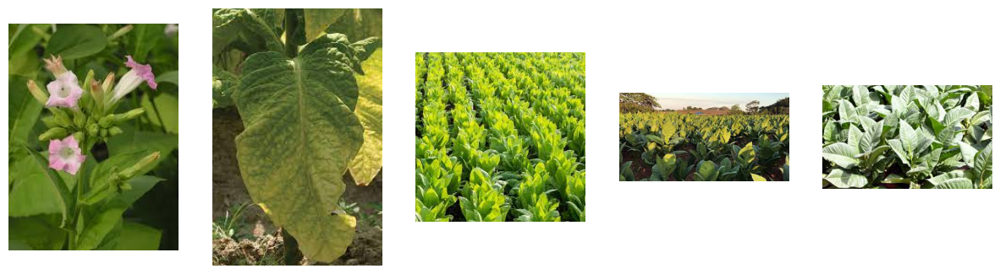

Crop: tomato


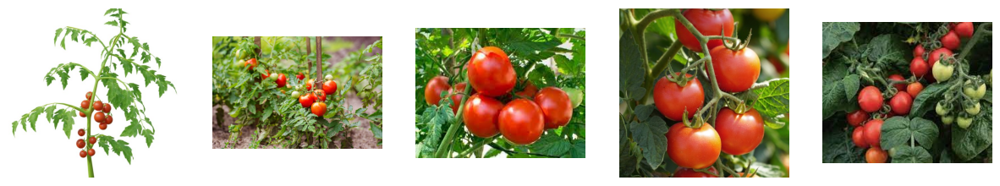

Crop: vigna-radiati(Mung)


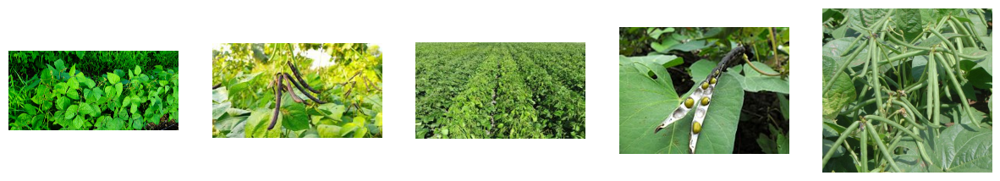

Crop: wheat


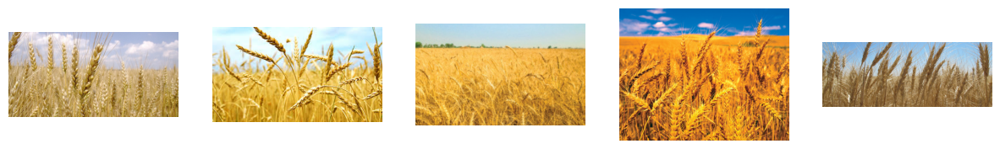

In [7]:
for subfolder in subfolders:
    crop_dir = os.path.join(path, subfolder)
    image_files = [os.path.join(crop_dir, filename) for filename in
                   os.listdir(crop_dir) if os.path.isfile(os.path.join(crop_dir, filename))]

# Explaining backwards:
#    Join each Image name, i.e. 'filename', to entire path and then checking if its a file,
#    If its a file :
#    List comprehension to store each image path of that subfolder(e.x.: cherry), by joining each image name to the entire path

    if len(image_files) >= 5:
        random_images = random.sample(image_files, 5)    # Want to display 5 images/-crop

        print(f"Crop: {subfolder}")
        plt.figure(figsize=(15, 5))

        for i, image_path in enumerate(random_images):
            plt.subplot(1, 5, i + 1)
            img = mpimg.imread(image_path)
            plt.imshow(img)
            plt.axis('off')

        plt.show()

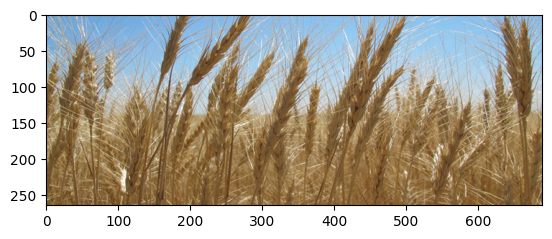

(265, 690, 3)


In [8]:
plt.imshow(img)
plt.show()
print(img.shape)

In [30]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

img_size = 224
Batch_size = 32
train_datagen = ImageDataGenerator(
    rescale = 1.0/255,
    validation_split = 0.20,
    horizontal_flip = True,
    rotation_range = 20,
    zoom_range = 0.2,
    width_shift_range=0.2,
    height_shift_range=0.2
    
)

train =  train_datagen.flow_from_directory(
    path,
    target_size = (img_size,img_size),
    batch_size = Batch_size,
    shuffle = True,
    subset = 'training',
    class_mode='categorical'
)


test = train_datagen.flow_from_directory(
    path,
    target_size = (img_size,img_size),
    batch_size = Batch_size,
    shuffle = True,
    subset = 'validation',
    class_mode='categorical'
)

Found 691 images belonging to 30 classes.
Found 159 images belonging to 30 classes.


In [31]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [32]:
model = Sequential()
model.add(tf.keras.Input(shape=(224, 224, 3)))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(len(train.class_indices), activation='softmax'))

In [21]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 30)             │         3,870 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,172,830 (42.62 MB)

 Trainable params: 11,172,830 (42.62 MB)

 Non-trainable params: 0 (0.00 B)

Here We use Categorical crossentropy instead of sparse-categorical-entropy. This is due to the labels, which arent One-hot encoded here.

In [33]:
model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics = ['accuracy']) 

In [34]:
callback = EarlyStopping(monitor='val_accuracy',patience=5)

In [ ]:
history = model.fit(train, epochs = 50, validation_data = test, callbacks=callback )

In [25]:
loss, acc = model.evaluate(test)
acc

5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 322ms/step - accuracy: 0.2453 - loss: 2.6236


0.24528302252292633

 Implementing Transfer Learning as well


In [10]:
from keras.applications.resnet50 import ResNet50
from keras.models import Model
from keras.optimizers import Adam

In [27]:
resnet = ResNet50(input_shape=(224,224,3), weights='imagenet', include_top=False)

for layer in resnet.layers[:-15]:
    layer.trainable = False        # Unfreeze last 15 layers

In [28]:
x = Flatten()(resnet.output)
x = Dropout(0.5)(x)
pred = Dense(len(train.class_indices), activation='softmax')(x)

In [37]:
resnet.input

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=False, ragged=False, name=keras_tensor_124>

In [29]:
m = Model(inputs=resnet.input, outputs=pred)

m.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
m.summary()

In [30]:
cb = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
mc = ModelCheckpoint("crop_model.h5", monitor='val_accuracy', save_best_only=True )

hist = m.fit(train, epochs=50, validation_data=test, callbacks=[cb, mc])

Epoch 1/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 634ms/step - accuracy: 0.0476 - loss: 5.0919

22/22 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - accuracy: 0.0521 - loss: 4.6992 - val_accuracy: 0.0377 - val_loss: 3.7072
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - accuracy: 0.0967 - loss: 3.8233

22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 395ms/step - accuracy: 0.0999 - loss: 3.7957 - val_accuracy: 0.0503 - val_loss: 3.6548
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - accuracy: 0.1106 - loss: 3.4480

22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 522ms/step - accuracy: 0.1114 - loss: 3.4435 - val_accuracy: 0.0755 - val_loss: 3.5745
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 417ms/step - accuracy: 0.1375 - loss: 3.3866 - val_accuracy: 0.0377 - val_loss: 3.5363
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.1493 - loss: 3.2241

22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 399ms/step - accuracy: 0.1621 - loss: 3.1515 - val_accuracy: 0.0943 - val_loss: 3.4517
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 442ms/step - accuracy: 0.1664 - loss: 3.1542 - val_accuracy: 0.0629 - val_loss: 3.4780
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 424ms/step - accuracy: 0.1852 - loss: 3.0556 - val_accuracy: 0.0818 - val_loss: 3.4655
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.1800 - loss: 2.9724

22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 437ms/step - accuracy: 0.1795 - loss: 2.9672 - val_accuracy: 0.1258 - val_loss: 3.2630
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 425ms/step - accuracy: 0.1983 - loss: 2.9758 - val_accuracy: 0.0755 - val_loss: 3.2857
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 431ms/step - accuracy: 0.2200 - loss: 2.8466 - val_accuracy: 0.0755 - val_loss: 3.2375
Epoch 11/50
16/22 ━━━━━━━━━━━━━━━━━━━━ 2s 373ms/step - accuracy: 0.2753 - loss: 2.7268

22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 452ms/step - accuracy: 0.2475 - loss: 2.7554 - val_accuracy: 0.1321 - val_loss: 3.1669
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 460ms/step - accuracy: 0.2156 - loss: 2.8155 - val_accuracy: 0.1069 - val_loss: 3.1684
Epoch 13/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 451ms/step - accuracy: 0.2272 - loss: 2.7148 - val_accuracy: 0.0943 - val_loss: 3.1741
Epoch 14/50
17/22 ━━━━━━━━━━━━━━━━━━━━ 1s 361ms/step - accuracy: 0.2478 - loss: 2.7377

22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 447ms/step - accuracy: 0.2417 - loss: 2.6803 - val_accuracy: 0.1447 - val_loss: 3.0844
Epoch 15/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - accuracy: 0.2388 - loss: 2.6252 - val_accuracy: 0.1447 - val_loss: 3.0473
Epoch 16/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step - accuracy: 0.2872 - loss: 2.4975

22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 519ms/step - accuracy: 0.2808 - loss: 2.5256 - val_accuracy: 0.2013 - val_loss: 3.0188
Epoch 17/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 354ms/step - accuracy: 0.2793 - loss: 2.5626 - val_accuracy: 0.1761 - val_loss: 2.8806
Epoch 18/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 493ms/step - accuracy: 0.2779 - loss: 2.5384 - val_accuracy: 0.1824 - val_loss: 2.9401
Epoch 19/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 541ms/step - accuracy: 0.2923 - loss: 2.4542 - val_accuracy: 0.1509 - val_loss: 3.1253
Epoch 20/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step - accuracy: 0.3148 - loss: 2.3190

22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 558ms/step - accuracy: 0.3068 - loss: 2.3649 - val_accuracy: 0.2075 - val_loss: 3.1919
Epoch 21/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 16s 706ms/step - accuracy: 0.2721 - loss: 2.4084 - val_accuracy: 0.1950 - val_loss: 3.0978
Epoch 22/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 470ms/step - accuracy: 0.3401 - loss: 2.3487 - val_accuracy: 0.1761 - val_loss: 3.1546
Epoch 23/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - accuracy: 0.2987 - loss: 2.4246

22/22 ━━━━━━━━━━━━━━━━━━━━ 13s 608ms/step - accuracy: 0.2981 - loss: 2.4682 - val_accuracy: 0.2138 - val_loss: 3.1419
Epoch 24/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 498ms/step - accuracy: 0.3184 - loss: 2.3255 - val_accuracy: 0.2013 - val_loss: 2.8743
Epoch 25/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 379ms/step - accuracy: 0.3097 - loss: 2.3860 - val_accuracy: 0.1761 - val_loss: 3.1627
Epoch 26/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 438ms/step - accuracy: 0.3444 - loss: 2.3163 - val_accuracy: 0.1572 - val_loss: 3.4617
Epoch 27/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 486ms/step - accuracy: 0.3473 - loss: 2.2588 - val_accuracy: 0.2013 - val_loss: 3.0668
Epoch 28/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 355ms/step - accuracy: 0.3430 - loss: 2.1299 - val_accuracy: 0.1887 - val_loss: 3.0369


High overfitting

In [31]:
loss, acc = m.evaluate(test)

5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 400ms/step - accuracy: 0.1824 - loss: 3.1218


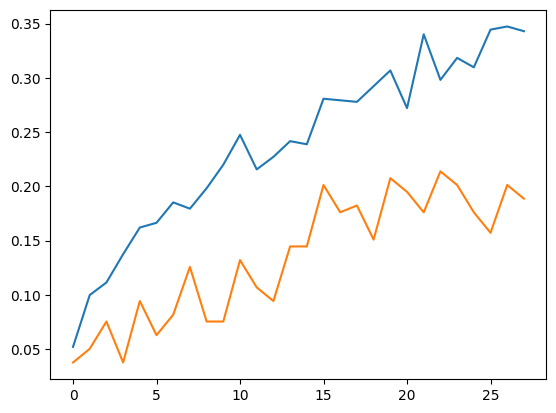

In [32]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])

In [12]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

#model = load_model("crop_model.h5")
img_path = "/mnt/c/Rig/Pandora's BOX/DL/test_image.jpg"

img = image.load_img(img_path, target_size=(224, 224,3))   

img_array = image.img_to_array(img)

# Add batch dimension (model expects shape: [batch, height, width, channels])
img_array = np.expand_dims(img_array, axis=0)

# Normalize if your training data was normalized (e.g., divide by 255)
img_array = img_array / 255.0

In [ ]:
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions,axis=1)
print("Predicted class index:", predicted_class)

In [ ]:
print(decode_predictions(predictions, top=3)[0])

In [36]:
subfolders[predicted_class[0]]

'coconut'

A very wrong answer

##### Here we will not provide Resnet with our test data, we use the data it is already trained on

In [13]:
from tensorflow.keras.applications.resnet50 import ResNet50, decode_predictions, preprocess_input

In [16]:
resnet = ResNet50(weights = 'imagenet')
for layer in resnet.layers[:-15]:
    layer.trainable = False 

In [17]:
img_path = "/mnt/c/Rig/Pandora's BOX/DL/test_image.jpg"
img = image.load_img(img_path,target_size=(224,224,3))
x = image.img_to_array(img)
x = np.expand_dims(x,axis=0)
x = preprocess_input(x)

In [24]:
predictions = resnet.predict(x)
predicted_class = np.argmax(predictions,axis=1)
print(decode_predictions(predictions)[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
Predicted class index: [998]
[('n13133613', 'ear', np.float32(0.9467922)), ('n12144580', 'corn', np.float32(0.04857208)), ('n09332890', 'lakeside', np.float32(0.0009723614)), ('n07802026', 'hay', np.float32(0.000739771)), ('n02410509', 'bison', np.float32(0.0003874051))]


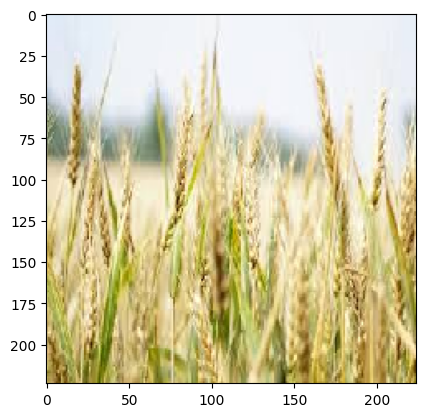

In [28]:
plt.imshow(img)

Checks out great!

